# Example `Dysmalpy` 3D fitting, using fitting wrapper

In this example, we use `dysmalpy` to measure the kinematics of galaxy **GS4_43501** at $z=1.613$ in 3D, using a fitting wrapper which simplifies the implementation of the fitting algorithm to the user. In this specific case, the fittign method is $\texttt{MPFIT}$, as specified at the bottom of the **fitting_3D_mpfit.params** file. The notebook shows how to generate a mask on the cube and then find the best fit models for the velocity and velocity dispersion profiles. These fits allow us to measure quantities such as the total mass (disk+bulge), the effective radius $r_\mathrm{eff}$, dark matter fraction $f_\mathrm{DM}$ and velocity dispersion $\sigma_0$.

**The fitting includes the following components:**

 - Disk + Bulge
 - NFW halo
 - Constant velocity dispersion
 
 **The structure of the notebook is the following:**
 
 1) Setup steps (and load the params file)
 2) Generate mask for this IFU cube
 2) Run `Dysmalpy` fitting: 3D wrapper, with fit method= MPFIT
 3) Examine results

:::{admonition} Note
The results of 3D fitting can greatly depend on how the 3D cube is masked. An automated 3D mask generation script is included in `DysmalPy` (as shown in the example here), but care should be taken in choosing appropriate parameters. Furthermore, it may be benefitial to hand-edit the mask to include/exclude spaxels or spectral regions.
:::

## 1) Setup steps ##

**Import modules**

In [102]:
from __future__ import (absolute_import, division, print_function,
                        unicode_literals)

from dysmalpy.fitting_wrappers import dysmalpy_fit_single
from dysmalpy.fitting_wrappers import utils_io
from dysmalpy import fitting, plotting

import os

import numpy as np

**Setup notebook**

In [103]:
# Setup plotting
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

mpl.rcParams['figure.dpi']= 100
mpl.rc("savefig", dpi=300)

from IPython.core.display import Image

**Set data, output paths**

_Note this will override the `datadir` and `outdir` specified in the param file._

_(This is useful for the example here. When running from command line, it's recommended to properly set the directories in the param file.)_

In [104]:
# Data directory (datadir = /YOUR/DATA/PATH/)
filepath = os.path.abspath(fitting.__file__)
datadir = os.sep.join(os.path.dirname(filepath).split(os.sep)[:-1]+["tests", "test_data", ""])

# Load the parameters file from the examples directory
param_path = os.sep.join(os.path.dirname(filepath).split(os.sep)[:-1]+["examples", "examples_param_files", ""])
param_filename = param_path+'fitting_3D_mpfit.params'

# Where to save output files (output = /YOUR/OUTPUTS/PATH)
outdir = '/Users/sedona/data/dysmalpy_test_examples/JUPYTER_OUTPUT_3D_FITTING_WRAPPER/'
outdir = '/Users/jespejo/Dropbox/Postdoc/Data/dysmalpy_test_examples/JUPYTER_OUTPUT_3D_FITTING_WRAPPER/'
outdir_mpfit = outdir + 'MPFIT/'

-------------------

**Settings in parameter file:**

Note there are many commented out options / parameters. These given an more complete overview of the settings & parameters that can be specified with the fitting wrapper parameter files.

In [105]:
with open(param_filename, 'r') as f:
    print(f.read())

# Example parameters file for fitting a single object with 1D data
# Note: DO NOT CHANGE THE NAMES IN THE 1ST COLUMN AND KEEP THE COMMAS!!
# See README for a description of each parameter and its available options.

# ******************************* OBJECT INFO **********************************
galID,    GS4_43501    # Name of your object
z,        1.613        # Redshift


# ****************************** DATA INFO *************************************

datadir,          None                       # Optional: Full path to data directory.

fdata_cube,           gs4-43501_h250_21h30.fits.gz   # Full path to vel map. Alternatively, just the filename if 'datadir' is set.
fdata_err,            noise_gs4-43501_h250_21h30.fits.gz    # Full path to vel. err map. Alternatively, just the filename if 'datadir' is set.
fdata_mask,           GS4_43501_mask.fits   # Full path to mask, if a separate mask is to be used.
#                                                          #   -- strongly recom

**Add some settings for this notebook example:**

In [106]:
plot_type = 'png'

--------

## 2) Generate mask for this IFU cube ##

As we don't have a premade mask for the data cube, we will use an automated script to generate a mask. 

This script can <span style="color:DarkCyan">***mask skylines***</span> (based on the spectral variance spectrum), as well as applying a <span style="color:DarkCyan">***segmentation map***</span> to limit the fitting to a contiguous region based on the integrated line flux. 

**Load parameters and galaxy**

First, you need to download the test fits files from:

https://www.mpe.mpg.de/resources/IR/DYSMALPY/dysmalpy_optional_extra_files/gs4-43501_h250_21h30.fits.gz

and 

https://www.mpe.mpg.de/resources/IR/DYSMALPY/dysmalpy_optional_extra_files/noise_gs4-43501_h250_21h30.fits.gz

You can either copy (or move) these files into your datadir directory, or you can create the envirnoment variables in the terminal as:

export FDATA_CUBE=/YOUR/DATA/PATH/gs4-43501_h250_21h30.fits.gz

export FDATA_ERR=/YOUR/DATA/PATH/noise_gs4-43501_h250_21h30.fits.gz

In [107]:
# You can also run the bash commands from within the notebook as (e.g. a directoy of one of the maintainers):
%env FDATA_CUBE=/Users/jespejo/Dropbox/Postdoc/dysmalpy/dysmalpy/dysmalpy/tests/test_data/gs4-43501_h250_21h30.fits.gz

%env FDATA_ERR=/Users/jespejo/Dropbox/Postdoc/dysmalpy/dysmalpy/dysmalpy/tests/test_data/noise_gs4-43501_h250_21h30.fits.gz

env: FDATA_CUBE=/Users/jespejo/Dropbox/Postdoc/dysmalpy/dysmalpy/dysmalpy/tests/test_data/gs4-43501_h250_21h30.fits.gz
env: FDATA_ERR=/Users/jespejo/Dropbox/Postdoc/dysmalpy/dysmalpy/dysmalpy/tests/test_data/noise_gs4-43501_h250_21h30.fits.gz


In [108]:
params = utils_io.read_fitting_params(fname=param_filename)

# check if the files are inside the datadir, if so load them from there:
if os.path.exists(datadir+"gs4-43501_h250_21h30.fits.gz") and os.path.exists(datadir+"noise_gs4-43501_h250_21h30.fits.gz"):
    gal = utils_io.load_galaxy(params=params, datadir=datadir, skip_mask=True, skip_automask=True)
# if not, load them from the environment variables
else:
    params["fdata_cube"] = os.getenv('FDATA_CUBE')
    params["fdata_err"] = os.getenv('FDATA_ERR')
    gal = utils_io.load_galaxy(params=params, datadir=None, skip_mask=True, skip_automask=True)

INFO:DysmalPy:dysmalpy.Galaxy:
********************************************************************
*** INFO ***
instrument.fov[0,1]=(37,37) is being reset to match 3D cube (31, 31)
********************************************************************

INFO:DysmalPy:dysmalpy.Galaxy:
********************************************************************
*** INFO ***
instrument spectral settings are being reset
   (spec_type=velocity, spec_start=-1000.00 km / s, spec_step=10.00 km / s, nspec=201)
   to match 3D cube
   (spec_type=velocity, spec_start=-484.72 km / s, spec_step=34.08 km / s, nspec=29)
********************************************************************



Note that any mismatches in the instrument FOV or spectral settings have been automatically set, and reset to match the input data cube.

**Generate mask**

In [109]:
mask, mask_dict = utils_io.generate_3D_mask(obs=gal.observations['OBS'], params=params) 

++++++++++++++++++++++++++++++++++++++++++++++++++++++
  Creating 3D auto mask with the following settings: 
        sig_segmap_thresh   = 3.25 
        npix_segmap_min     = 5 
        snr_int_flux_thresh = 3 
        snr_thresh_pixel    = None 
        sky_var_thresh      = 2 
        apply_skymask_first = True 
++++++++++++++++++++++++++++++++++++++++++++++++++++++

 Masking segmap: used exclude_percentile=15.0


Note that we set the relevant parameters (`sig_segmap_thresk`, `npix_segmap_min`, `sky_var_thresh`, etc.) in the parameters file, by prepending `auto_gen_mask_` to the keyword names.

These parameters (`sig_segmap_thresk`, `npix_segmap_min`, `sky_var_thresh`, etc.) can also be <span style="color:FireBrick">_passed directly_</span> to `utils_io.generate_3D_mask()`, which can be helpful when exploring different parameter settings.

**Examine mask info**

First look at the integrated spatial flux maps and segmaps

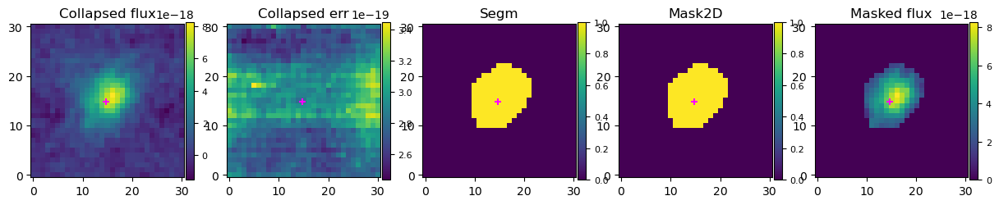

In [110]:
plotting.plot_3D_data_automask_info(gal.observations['OBS'], mask_dict)

Then examine the per-spaxel spectra, to see if the skyline masking/velocity cropping and the segmentation map masking is sufficient.

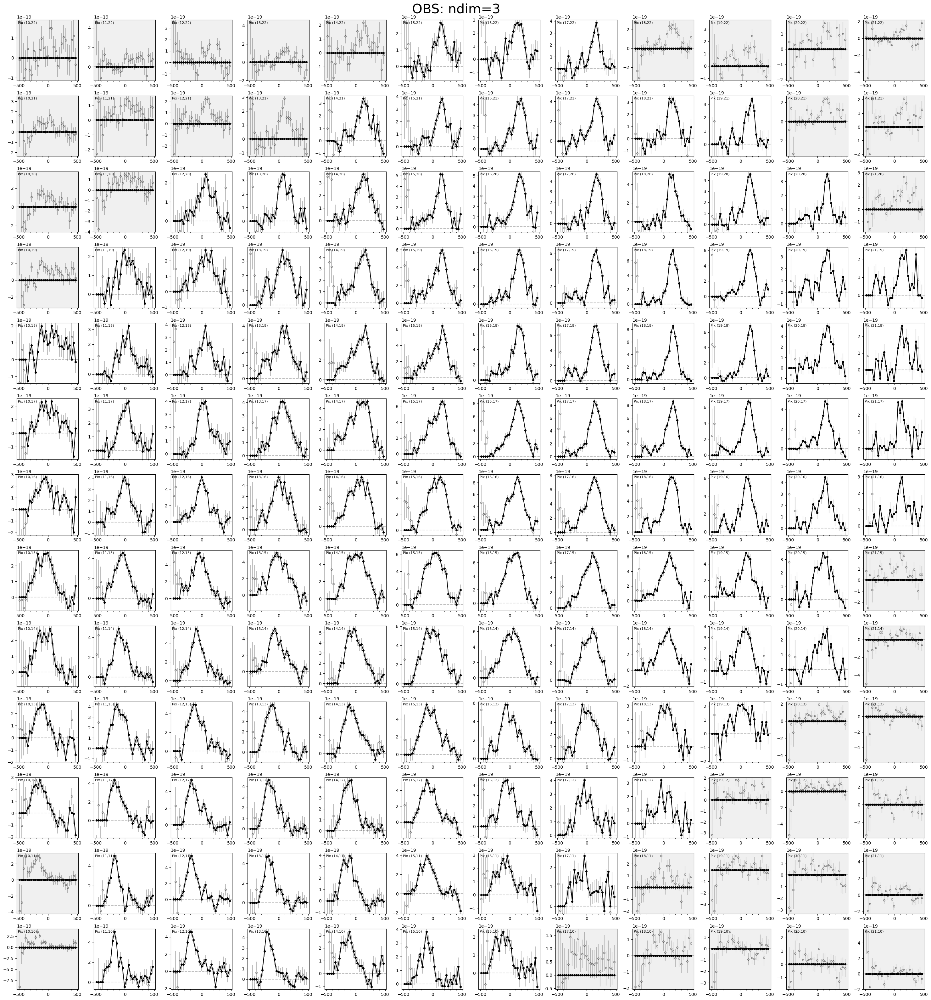

In [111]:
gal.observations['OBS'].data.mask = np.array(mask, dtype=bool)
plotting.plot_spaxel_compare_3D_cubes(gal.observations['OBS'], skip_fits=True)

**Save mask**

After finalizing the parameters, save a copy of the mask to a FITS file (to the filename specified with `fdata_mask` in the params file).

Note we will backmap the mask to the uncropped cube size, so the raw data and error cubes can be directly compared to raw mask file. (The same cropping will be applied to the data, error, and mask cubes when loading the data for fitting.)

In [112]:
utils_io.save_3D_mask(obs=gal.observations['OBS'], mask=mask, 
                      filename=datadir+params['fdata_mask'], 
                      save_uncropped_size=True, overwrite=True)

Note that we set the relevant parameters (`sig_segmap_thresk`, `npix_segmap_min`, `sky_var_thresh`, etc.) in the parameters file. 

If `fdata_mask` is not set in the param file, or if the file is not found, then when running the fitting wrapper the behavior will fall back to creating a mask on the fly (as by default `skip_automask=False`). 

In this case, the automatic mask generation uses the specified automask parameters in the param file (or else falls back to the automask defaults, if not specified).

However, if the mask is generated on the fly, it will not be saved to a separate FITS file (though it will be accessible in the `galaxy` object stored in the "galaxy model" pickle).

For this example, we choose to directly save the mask to a FITS file, for clarity.

--------

## 3) Run `Dysmalpy` fitting: 3D wrapper, with fit method= MPFIT ##

In [113]:
dysmalpy_fit_single.dysmalpy_fit_single(param_filename=param_filename, 
                                        datadir=datadir, outdir=outdir_mpfit, 
                                        plot_type=plot_type, overwrite=True)

INFO:DysmalPy:dysmalpy.Galaxy:
********************************************************************
*** INFO ***
instrument.fov[0,1]=(37,37) is being reset to match 3D cube (31, 31)
********************************************************************

INFO:DysmalPy:dysmalpy.Galaxy:
********************************************************************
*** INFO ***
instrument spectral settings are being reset
   (spec_type=velocity, spec_start=-1000.00 km / s, spec_step=10.00 km / s, nspec=201)
   to match 3D cube
   (spec_type=velocity, spec_start=-484.72 km / s, spec_step=34.08 km / s, nspec=29)
********************************************************************

INFO:DysmalPy:*************************************
INFO:DysmalPy: Fitting: GS4_43501 using MPFIT
INFO:DysmalPy:    obs: OBS
INFO:DysmalPy:        nSubpixels: 1
INFO:DysmalPy:    mvirial_tied: False
INFO:DysmalPy:
MPFIT Fitting:
Start: 2024-05-02 10:46:14.208246

INFO:DysmalPy:Iter 1  CHI-SQUARE = 4218.164951  DOF = 27860
   d

plot_model_multid: ndim=3: moment=False
------------------------------------------------------------------
 Dysmalpy MPFIT fitting complete for: GS4_43501
   output folder: /Users/jespejo/Dropbox/Postdoc/Data/dysmalpy_test_examples/JUPYTER_OUTPUT_3D_FITTING_WRAPPER/MPFIT/
------------------------------------------------------------------
 


------

## 4) Examine results ##

**List all saved files in output directory:**

In [114]:
for f in os.listdir(outdir_mpfit): print(f)

GS4_43501_mpfit_bestfit_results_report.info
GS4_43501_LINE_bestfit_velprofile.dat
GS4_43501_mpfit_bestfit_OBS_extract_1D.png
GS4_43501_menc_tot_bary_dm.dat
GS4_43501_mpfit_results.pickle
GS4_43501_OBS_bestfit_cube.fits
GS4_43501_mpfit_bestfit_results.dat
GS4_43501_fit_report.txt
GS4_43501_fitting_3D_mpfit.params
GS4_43501_bestfit_menc.dat
GS4_43501_mpfit_bestfit_OBS_spaxels.png
GS4_43501_mpfit.log
GS4_43501_mpfit_bestfit_OBS_apertures.png
GS4_43501_OBS_out-cube.fits
GS4_43501_model.pickle
GS4_43501_vcirc_tot_bary_dm.dat
GS4_43501_mpfit_bestfit_OBS_extract_2D.png
GS4_43501_mpfit_bestfit_OBS_channels.png
GS4_43501_bestfit_vcirc.dat


### Result plots ###

**Read in parameter file**

In [115]:
params = utils_io.read_fitting_params(fname=param_filename)

# Override data + output paths:
params['datadir'] = datadir
params['outdir'] = outdir_mpfit

# Add the plot type:
params['plot_type'] = plot_type

f_galmodel = params['outdir'] + '{}_model.pickle'.format(params['galID'])
f_results =  params['outdir'] + '{}_{}_results.pickle'.format(params['galID'], 
                                                              params['fit_method'])

**Best-fit plot (extracted to 1D circular apertures and 2D maps):**

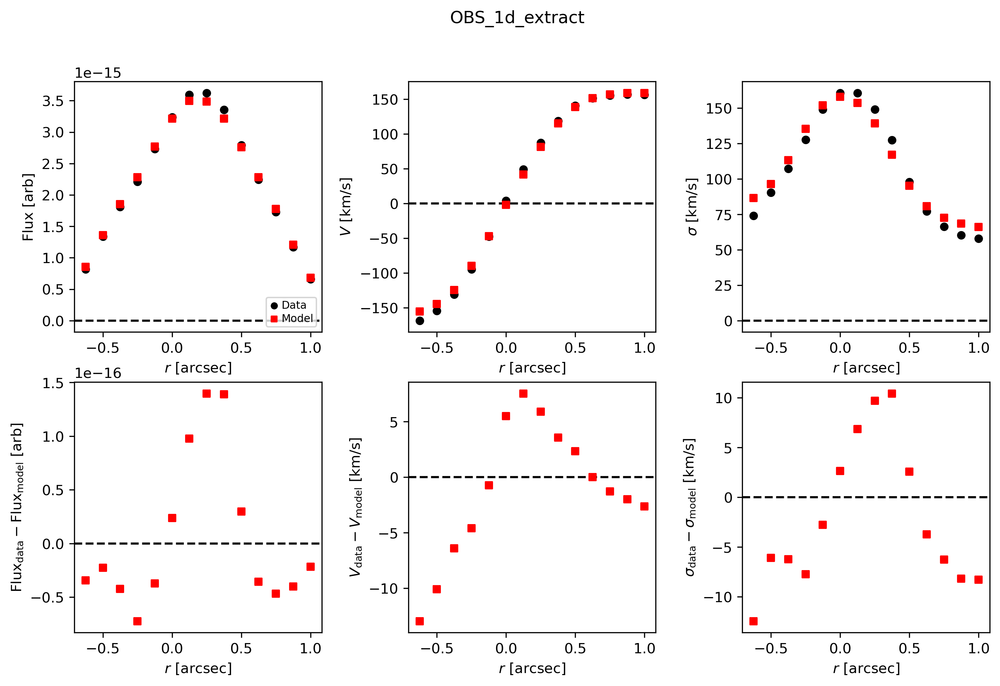

In [116]:
# Look at best-fit:
filepath = outdir_mpfit+"{}_{}_bestfit_{}_extract_1D.{}".format(params['galID'], 
                                                  params['fit_method'], 
                                                  params['obs_1_name'], 
                                                  params['plot_type'])
Image(filename=filepath, width=600)

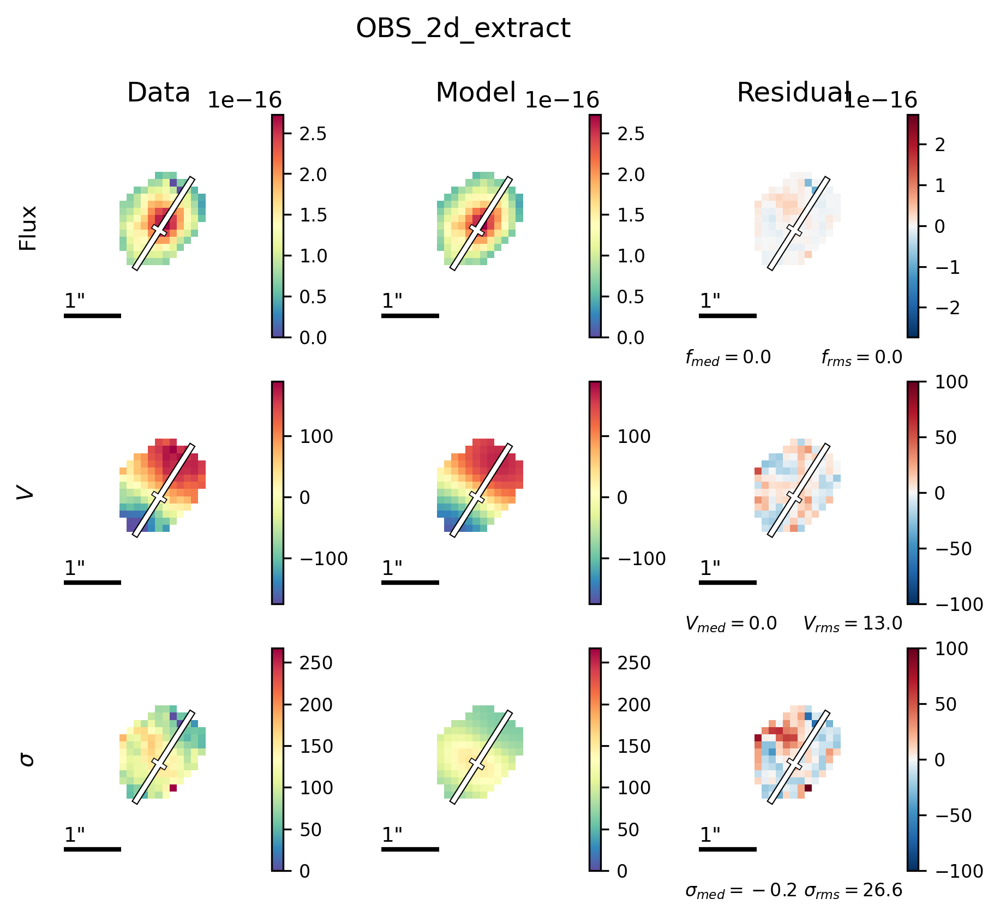

In [117]:
filepath = outdir_mpfit+"{}_{}_bestfit_{}_extract_2D.{}".format(params['galID'], 
                                                  params['fit_method'], 
                                                  params['obs_1_name'], 
                                                  params['plot_type'])
Image(filename=filepath, width=600)

**LOS velocity distribution in each of the 1D circular apertures:**

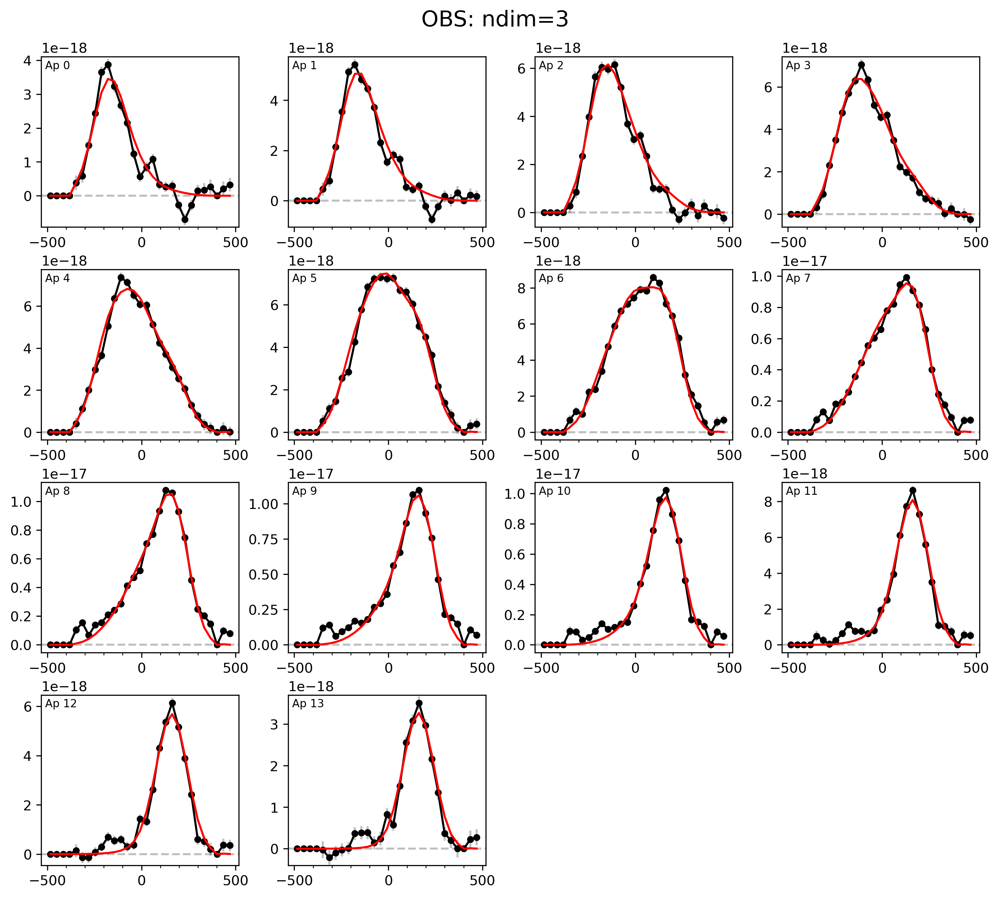

In [118]:
# Look at per-aperture profiles:
filepath = outdir_mpfit+"{}_{}_bestfit_{}_apertures.{}".format(params['galID'], 
                                                               params['fit_method'], 
                                                               params['obs_1_name'], 
                                                               params['plot_type'])
Image(filename=filepath, width=600)

**LOS velocity distribution in each spaxel:**

In [119]:
# Look at per-spaxel profiles:
filepath = outdir_mpfit+"{}_{}_bestfit_{}_spaxels.{}".format(params['galID'], 
                                                             params['fit_method'], 
                                                             params['obs_1_name'], 
                                                             params['plot_type'])
Image(filename=filepath, width=600)

**Channel maps:**

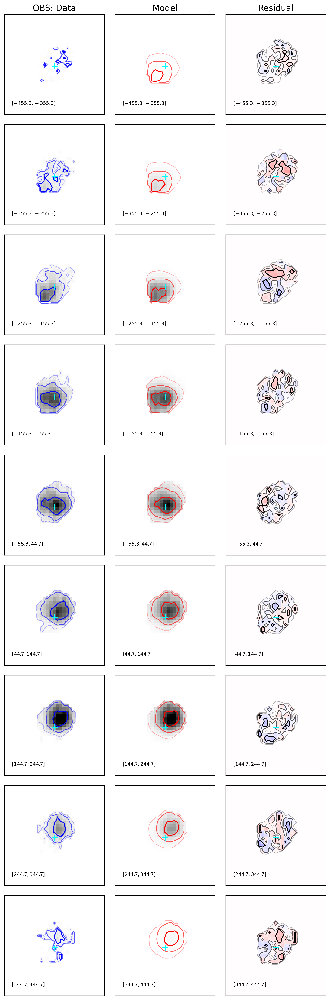

In [120]:
# Look at channel maps:
filepath = outdir_mpfit+"{}_{}_bestfit_{}_channels.{}".format(params['galID'], 
                                                              params['fit_method'], 
                                                              params['obs_1_name'], 
                                                              params['plot_type'])
Image(filename=filepath, width=600)

#### Directly generating result plots ####

**Reload the galaxy, results files:**

In [121]:
gal, results = fitting.reload_all_fitting(filename_galmodel=f_galmodel, 
                                          filename_results=f_results, 
                                          fit_method=params['fit_method'])

**Plot the best-fit results:**

plot_model_multid: ndim=3: moment=False


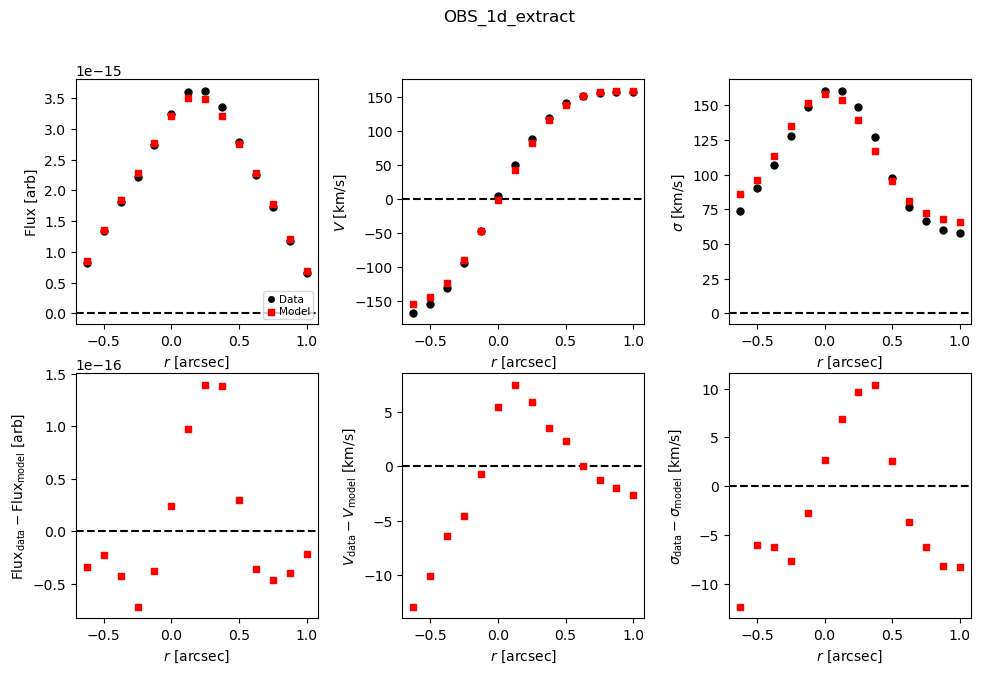

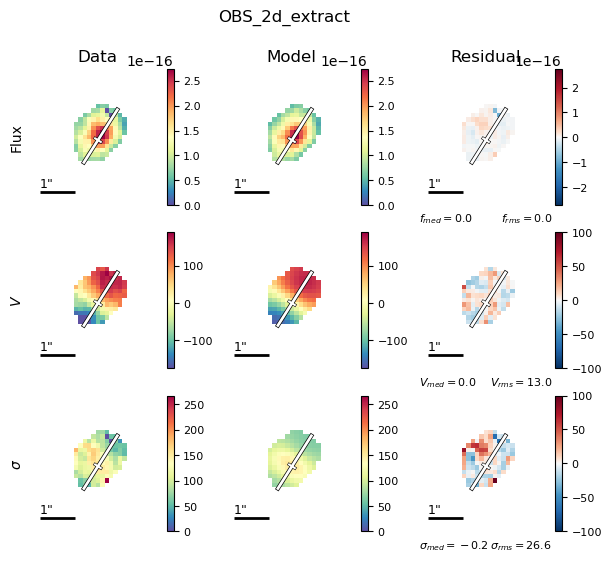

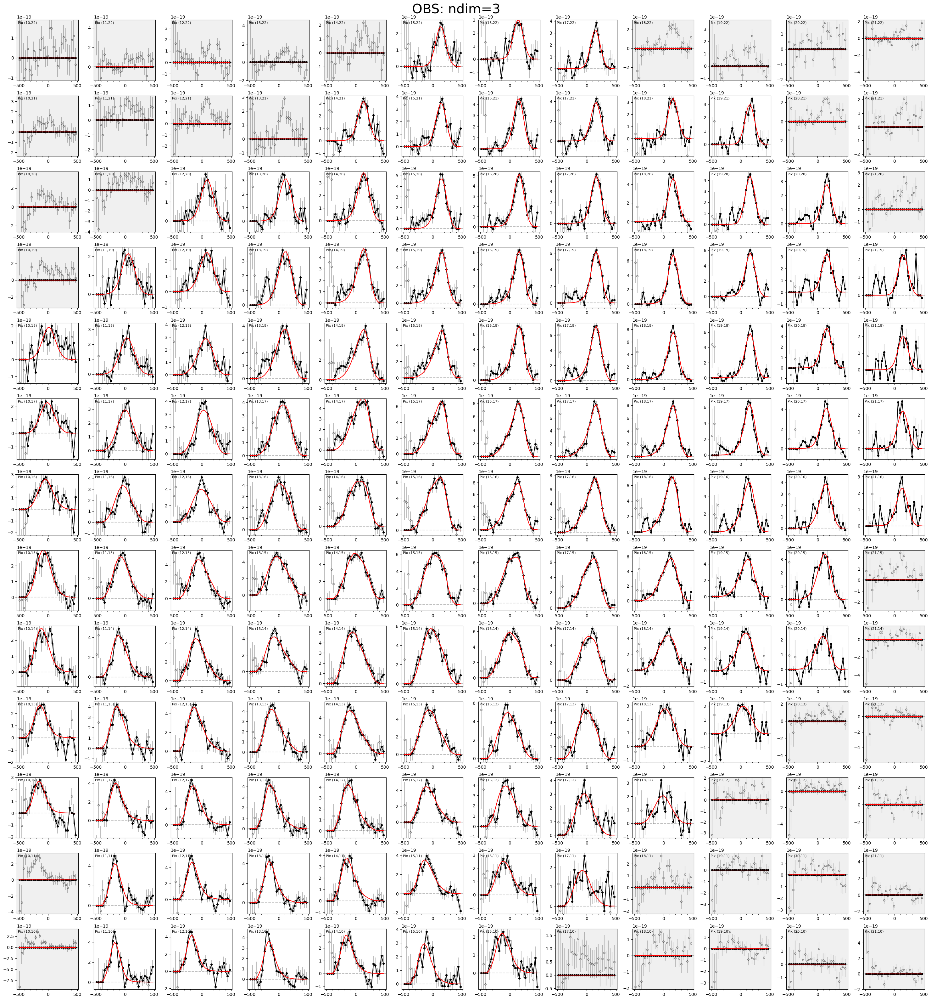

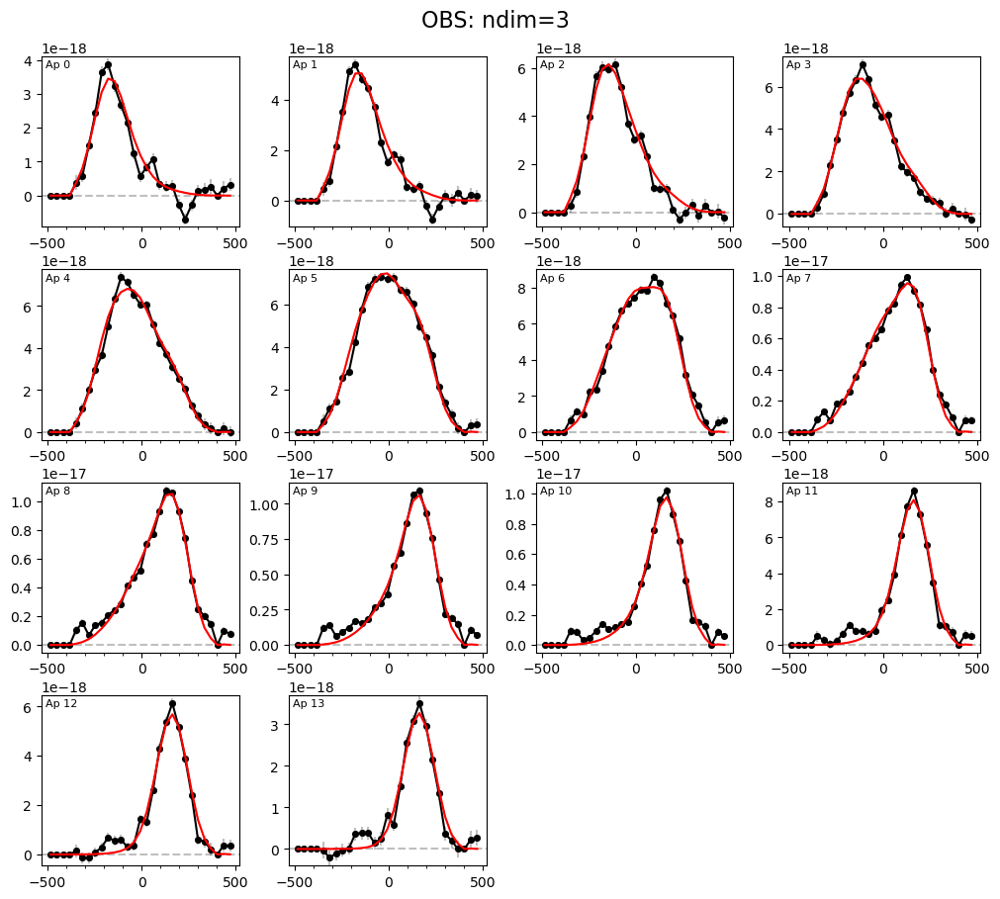

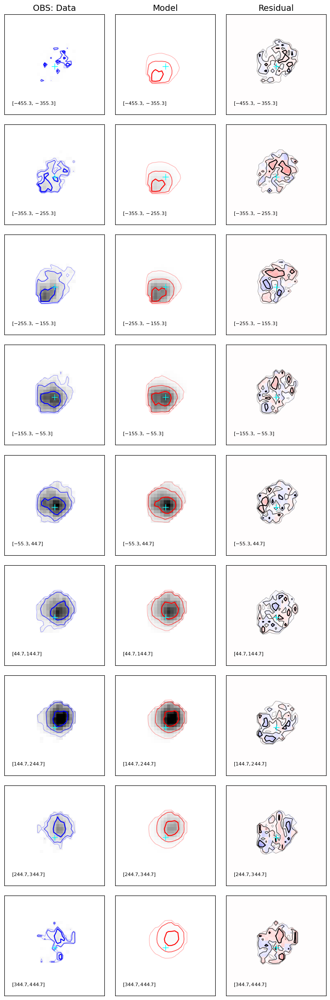

In [122]:
results.plot_results(gal)

--------

### Results reports ###

We now look at the results reports, which include the best-fit values and uncertainties (as well as other fitting settings and output).

In [123]:
# Print report
print(results.results_report(gal=gal))

###############################
 Fitting for GS4_43501

Date: 2024-05-02 10:47:05.749237

    obs: OBS
         Datafiles:
         zcalc_truncate:        True
         n_wholepix_z_min:      3
         oversample:            1
         oversize:              1


Fitting method: MPFIT
    fit status: 1

pressure_support:      True
pressure_support_type: 1

###############################
 Fitting results
-----------
 disk+bulge
    total_mass         10.8402  +/-   0.0915
    r_eff_disk          2.0386  +/-   0.0685

    n_disk              1.0000  [FIXED]
    r_eff_bulge         1.0000  [FIXED]
    n_bulge             4.0000  [FIXED]
    bt                  0.3000  [FIXED]
    mass_to_light       1.0000  [FIXED]

    noord_flat          True
-----------
 halo
    mvirial            12.8051  +/-   0.1290

    fdm                 0.1593  [TIED]
    conc                5.0000  [FIXED]
-----------
 dispprof_LINE
    sigma0             59.0993  +/-   1.5962
-----------
 zheightgaus
    sig

**To <span style="color:DarkCyan">directly save</span> the results report** to a file, we can use the following:

In [124]:
# Save report to file:
f_report = params['outdir'] + '{}_fit_report.txt'.format(params['galID'])
results.results_report(gal=gal, filename=f_report)

**Also note the fitting wrappers automatically save two versions of the report files:**

In [125]:
fbase = '{}_{}_bestfit_results'.format(params['galID'], params['fit_method'])
f_report_pretty =  params['outdir'] + fbase + '_report.info'
f_report_machine = params['outdir'] + fbase + '.dat'

The "pretty" version, automatically saved as `*_best_fit_results_report.info`, is formatted to be human-readable, and includes more information on the fit settings at the beginning (for reference).

In [126]:
with open(f_report_pretty, 'r') as f:
    lines = [line.rstrip() for line in f]
    for line in lines: print(line)

###############################
 Fitting for GS4_43501

Date: 2024-05-02 10:46:54.021042

    obs: OBS
         Datafiles:
         zcalc_truncate:        True
         n_wholepix_z_min:      3
         oversample:            1
         oversize:              1


Fitting method: MPFIT
    fit status: 1

pressure_support:      True
pressure_support_type: 1

###############################
 Fitting results
-----------
 disk+bulge
    total_mass         10.8402  +/-   0.0915
    r_eff_disk          2.0386  +/-   0.0685

    n_disk              1.0000  [FIXED]
    r_eff_bulge         1.0000  [FIXED]
    n_bulge             4.0000  [FIXED]
    bt                  0.3000  [FIXED]
    mass_to_light       1.0000  [FIXED]

    noord_flat          True
-----------
 halo
    mvirial            12.8051  +/-   0.1290

    fdm                 0.1593  [TIED]
    conc                5.0000  [FIXED]
-----------
 dispprof_LINE
    sigma0             59.0993  +/-   1.5962
-----------
 zheightgaus
    sig

The "machine" version, automatically saved as `*_best_fit_results.dat`, is formatted as a machine-readable space-separated ascii file. It includes key parameter fit information, as well as the best-fit reduced chisq.

In [127]:
with open(f_report_machine, 'r') as f:
    lines = [line.rstrip() for line in f]
    for line in lines: print(line)

# component             param_name      fixed       best_value   l68_err     u68_err
disk+bulge              total_mass      False        10.8402      0.0915      0.0915
disk+bulge              r_eff_disk      False         2.0386      0.0685      0.0685
disk+bulge              n_disk          True          1.0000    -99.0000    -99.0000
disk+bulge              r_eff_bulge     True          1.0000    -99.0000    -99.0000
disk+bulge              n_bulge         True          4.0000    -99.0000    -99.0000
disk+bulge              bt              True          0.3000    -99.0000    -99.0000
disk+bulge              mass_to_light   True          1.0000    -99.0000    -99.0000
halo                    mvirial         False        12.8051      0.1290      0.1290
halo                    fdm             TIED          0.1593    -99.0000    -99.0000
halo                    conc            True          5.0000    -99.0000    -99.0000
dispprof_LINE           sigma0          False        59.0993     